## Importaciones y configuración inicial

In [29]:
# Importaciones generales del cuaderno

import os
import torch
import evaluate
import numpy as np
import librosa
import warnings
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path
from dataclasses import dataclass
from typing import Any, Dict, List, Union
from IPython.display import Audio as IPythonAudio, display

from datasets import load_from_disk, Audio

from transformers import (
    WhisperProcessor,
    WhisperFeatureExtractor,
    WhisperTokenizer,
    WhisperForConditionalGeneration,
    Seq2SeqTrainingArguments,
    Seq2SeqTrainer,
    GenerationConfig,
)

In [21]:
# CONFIGURACIÓN PRINCIPAL

# Nombre del modelo base de Whisper que vamos a usar
MODEL_NAME = "openai/whisper-base"

# Ruta del dataset previamente preparado y guardado en disco 
INPUT_DATASET = r"C:\lara\datasets\lara_whisper_dataset"

# Ruta donde guardaremos el dataset ya preparado para Whisper
PREPARED_DATASET = r"C:\lara\datasets\lara_whisper_dataset_preparado"

# Ruta donde se guardará el modelo entrenado
OUTPUT_DIR = r"C:\lara\modelos_entrenados\whisper_base"

# Ruta donde están los audios convertidos
AUDIOS_CONVERTED_PATH = r"C:\Lara\audios-230426\audios-s3"

# Configuración de idioma y tarea
LANGUAGE = "Spanish"
TASK = "transcribe"

# Semilla para intentar que los resultados sean reproducibles
SEED = 42

# Dispositivo de entrenamiento
DEVICE = "cuda"

# Frecuencia de muestreo esperada por Whisper
SAMPLING_RATE = 16000

# Parámetros generales de entrenamiento
NUM_TRAIN_EPOCHS = 5
LEARNING_RATE = 0.00001

TRAIN_BATCH_SIZE = 4
EVAL_BATCH_SIZE = 4

GRADIENT_ACCUMULATION_STEPS = 2 # Para simular un batch size de 8 sin necesidad de tanta memoria GPU batch size de 4 * 2 pasos de acumulación = batch size efectivo de 8

In [22]:
# Fijamos la semilla para intentar que los resultados sean reproducibles

torch.manual_seed(SEED)
np.random.seed(SEED)

if DEVICE == "cuda":
    torch.cuda.manual_seed_all(SEED)

print("Semilla configurada:", SEED)
print("Dispositivo configurado:", DEVICE)

Semilla configurada: 42
Dispositivo configurado: cuda


## Carga del dataset

In [3]:
# Cargamos el dataset sin decodificación automática del audio

dataset = load_from_disk(INPUT_DATASET)

dataset = dataset.cast_column(
    "audio",
    Audio(decode=False)
)

print("Dataset cargado correctamente")
print("----------------------------------------")
print(dataset)

Dataset cargado correctamente
----------------------------------------
Dataset({
    features: ['audio', 'texto'],
    num_rows: 40842
})


In [4]:
# Comprobamos una muestra cargando el audio con librosa

indice = np.random.randint(0, len(dataset))
muestra = dataset[indice]

ruta_audio = Path(muestra["audio"]["path"])

# Si la ruta guardada no es absoluta, reconstruimos la ruta completa
if not ruta_audio.is_absolute():
    ruta_audio = Path(AUDIOS_CONVERTED_PATH) / ruta_audio.name

# Cargamos el audio a 16 kHz
audio_array, sampling_rate = librosa.load(
    str(ruta_audio),
    sr=SAMPLING_RATE,
    mono=True
)

print("Dataset cargado correctamente")
print(f"Número de registros: {len(dataset)}")
print("-" * 40)

print(f"Índice de muestra: {indice}")
print(f"Texto: {muestra['texto']}")
print(f"Ruta audio: {ruta_audio}")
print(f"Sampling rate usado: {sampling_rate}")
print(f"Duración aproximada: {len(audio_array) / sampling_rate:.2f} segundos")
print("-" * 40)

display(
    IPythonAudio(
        data=audio_array,
        rate=sampling_rate
    )
)

C:\Users\abelg\AppData\Local\Temp\ipykernel_16860\3989053426.py:13: UserWarning: PySoundFile failed. Trying audioread instead.
  audio_array, sampling_rate = librosa.load(
c:\Users\abelg\AppData\Local\Programs\Python\Python313\Lib\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Dataset cargado correctamente
Número de registros: 40842
----------------------------------------
Índice de muestra: 21033
Texto: CURRO TIENE ARRUGAS Y UNA VERRUGA.
Ruta audio: C:\Lara\audios-230426\audios-s3\67861d533b2390a0e78d9682_1737625608.wav
Sampling rate usado: 16000
Duración aproximada: 7.62 segundos
----------------------------------------


## Preparación para Whisper

In [5]:
# Cargamos los componentes necesarios de Whisper

feature_extractor = WhisperFeatureExtractor.from_pretrained(MODEL_NAME)

tokenizer = WhisperTokenizer.from_pretrained(
    MODEL_NAME,
    language=LANGUAGE,
    task=TASK
)

processor = WhisperProcessor.from_pretrained(
    MODEL_NAME,
    language=LANGUAGE,
    task=TASK
)

print("Componentes de Whisper cargados correctamente")
print("----------------------------------------")
print("Modelo base:", MODEL_NAME)
print("Idioma:", LANGUAGE)
print("Tarea:", TASK)

Componentes de Whisper cargados correctamente
----------------------------------------
Modelo base: openai/whisper-base
Idioma: Spanish
Tarea: transcribe


In [6]:
# Probamos que el tokenizer convierte correctamente un texto de ejemplo

texto_prueba = dataset[0]["texto"]

tokens = tokenizer(texto_prueba)

print("Texto original:")
print(texto_prueba)

print("----------------------------------------")
print("Tokens generados:")
print(tokens["input_ids"])

print("----------------------------------------")
print("Texto reconstruido:")
print(tokenizer.decode(tokens["input_ids"], skip_special_tokens=True))

[transformers] Ignoring clean_up_tokenization_spaces=True for BPE tokenizer WhisperTokenizer. The clean_up_tokenization post-processing step is designed for WordPiece tokenizers and is destructive for BPE (it strips spaces before punctuation). Set clean_up_tokenization_spaces=False to suppress this warning, or set clean_up_tokenization_spaces_for_bpe_even_though_it_will_corrupt_output=True to force cleanup anyway.


Texto original:
La bata tiene veinte botones.
----------------------------------------
Tokens generados:
[50258, 50262, 50359, 50363, 5478, 272, 3274, 7066, 1241, 12401, 10592, 2213, 13, 50257]
----------------------------------------
Texto reconstruido:
La bata tiene veinte botones.


In [7]:
# Función para preparar cada registro del dataset para Whisper

def preparar_dataset(batch):
    # Reconstruimos la ruta del audio
    ruta_audio = Path(batch["audio"]["path"])

    if not ruta_audio.is_absolute():
        ruta_audio = Path(AUDIOS_CONVERTED_PATH) / ruta_audio.name

    # Cargamos el audio con librosa a 16 kHz
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", message="PySoundFile failed.*") # Ignoramos esta advertencia específica que puede surgir con algunos archivos de audio

        audio_array, sampling_rate = librosa.load(
            str(ruta_audio),
            sr=SAMPLING_RATE,
            mono=True
        )

    # Convertimos el audio en características numéricas para Whisper
    batch["input_features"] = feature_extractor(
        audio_array,
        sampling_rate=sampling_rate
    ).input_features[0]

    # Convertimos el texto en tokens/labels
    batch["labels"] = tokenizer(
        batch["texto"]
    ).input_ids

    return batch

In [8]:
# Probamos la función con una única muestra antes de aplicarla al dataset completo

muestra_preparada = preparar_dataset(dataset[0])

print("Muestra preparada correctamente")
print("----------------------------------------")
print("Input features shape:", np.array(muestra_preparada["input_features"]).shape)
print("Número de labels:", len(muestra_preparada["labels"]))
print("Labels:", muestra_preparada["labels"])
print("----------------------------------------")
print("Texto reconstruido:")
print(tokenizer.decode(muestra_preparada["labels"], skip_special_tokens=True))

Muestra preparada correctamente
----------------------------------------
Input features shape: (80, 3000)
Número de labels: 14
Labels: [50258, 50262, 50359, 50363, 5478, 272, 3274, 7066, 1241, 12401, 10592, 2213, 13, 50257]
----------------------------------------
Texto reconstruido:
La bata tiene veinte botones.


c:\Users\abelg\AppData\Local\Programs\Python\Python313\Lib\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


In [9]:
# Aplicamos la preparación a todo el dataset

dataset_preparado = dataset.map(
    preparar_dataset,
    remove_columns=dataset.column_names
)

print("Dataset preparado correctamente")
print("----------------------------------------")
print(dataset_preparado)

Map:   0%|          | 0/40842 [00:00<?, ? examples/s]

c:\Users\abelg\AppData\Local\Programs\Python\Python313\Lib\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)
c:\Users\abelg\AppData\Local\Programs\Python\Python313\Lib\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)
c:\Users\abelg\AppData\Local\Programs\Python\Python313\Lib\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)
c:\Users\abelg\AppData\Local\Programs\Python\Python313\Lib\site-packages\librosa\core\audio.py

Dataset preparado correctamente
----------------------------------------
Dataset({
    features: ['input_features', 'labels'],
    num_rows: 40842
})


In [10]:
# Guardamos el dataset ya preparado para reutilizarlo en otros entrenamientos

dataset_preparado.save_to_disk(PREPARED_DATASET)

print("Dataset preparado guardado correctamente")
print("----------------------------------------")
print("Ruta:", PREPARED_DATASET)
print(dataset_preparado)

Saving the dataset (0/79 shards):   0%|          | 0/40842 [00:00<?, ? examples/s]

Dataset preparado guardado correctamente
----------------------------------------
Ruta: C:\lara\datasets\lara_whisper_dataset_preparado
Dataset({
    features: ['input_features', 'labels'],
    num_rows: 40842
})


## División del dataset

In [15]:
# Dividimos el dataset preparado en train, test y validation
# 80% train
# Del 20% restante: 80% test y 20% validation

dataset_split = dataset_preparado.train_test_split(
    test_size=0.20,
    seed=SEED
)

dataset_temp = dataset_split["test"].train_test_split(
    test_size=0.20,
    seed=SEED
)

dataset_train_test_eval = {
    "train": dataset_split["train"],
    "test": dataset_temp["train"],
    "validation": dataset_temp["test"]
}

print("Dataset dividido correctamente")
print("----------------------------------------")
print("Registros de entrenamiento:", len(dataset_train_test_eval["train"]))
print("Registros de test:", len(dataset_train_test_eval["test"]))
print("Registros de validación:", len(dataset_train_test_eval["validation"]))

print("----------------------------------------")
total = len(dataset_preparado)

print("Porcentaje train:", round(len(dataset_train_test_eval["train"]) / total * 100, 2), "%")
print("Porcentaje test:", round(len(dataset_train_test_eval["test"]) / total * 100, 2), "%")
print("Porcentaje validación:", round(len(dataset_train_test_eval["validation"]) / total * 100, 2), "%")

Dataset dividido correctamente
----------------------------------------
Registros de entrenamiento: 32673
Registros de test: 6535
Registros de validación: 1634
----------------------------------------
Porcentaje train: 80.0 %
Porcentaje test: 16.0 %
Porcentaje validación: 4.0 %


## Data collator

In [16]:
# Data collator específico para Whisper

@dataclass
class DataCollatorSpeechSeq2SeqWithPadding:
    processor: Any

    def __call__(self, features: List[Dict[str, Union[List[int], torch.Tensor]]]) -> Dict[str, torch.Tensor]:
        # Separamos las características de audio
        input_features = [
            {"input_features": feature["input_features"]}
            for feature in features
        ]

        batch = self.processor.feature_extractor.pad(
            input_features,
            return_tensors="pt"
        )

        # Separamos las etiquetas de texto
        label_features = [
            {"input_ids": feature["labels"]}
            for feature in features
        ]

        labels_batch = self.processor.tokenizer.pad(
            label_features,
            return_tensors="pt"
        )

        # Sustituimos el padding por -100 para que no compute en la loss
        labels = labels_batch["input_ids"].masked_fill(
            labels_batch.attention_mask.ne(1),
            -100
        )

        # Si todos los labels empiezan con el token BOS, lo eliminamos
        if (labels[:, 0] == self.processor.tokenizer.bos_token_id).all().cpu().item():
            labels = labels[:, 1:]

        batch["labels"] = labels

        return batch


data_collator = DataCollatorSpeechSeq2SeqWithPadding(
    processor=processor
)

print("Data collator creado correctamente")

Data collator creado correctamente


In [17]:
# Probamos el data collator con dos muestras del dataset de entrenamiento

batch_prueba = data_collator([
    dataset_train_test_eval["train"][0],
    dataset_train_test_eval["train"][1]
])

print("Batch creado correctamente")
print("----------------------------------------")
print("Input features shape:", batch_prueba["input_features"].shape)
print("Labels shape:", batch_prueba["labels"].shape)

Batch creado correctamente
----------------------------------------
Input features shape: torch.Size([2, 80, 3000])
Labels shape: torch.Size([2, 31])


## Métricas 

In [18]:
# Cargamos las métricas para evaluar el modelo

metric_wer = evaluate.load("wer")
metric_cer = evaluate.load("cer")

print("Métricas cargadas correctamente")
print("----------------------------------------")
print("WER: Word Error Rate")
print("CER: Character Error Rate")

Métricas cargadas correctamente
----------------------------------------
WER: Word Error Rate
CER: Character Error Rate


In [19]:
# Función para calcular WER y CER durante la evaluación

def compute_metrics(pred):
    pred_ids = pred.predictions
    label_ids = pred.label_ids

    # Sustituimos -100 por el token de padding para poder decodificar las etiquetas
    label_ids[label_ids == -100] = tokenizer.pad_token_id

    # Decodificamos predicciones y etiquetas
    pred_str = tokenizer.batch_decode(
        pred_ids,
        skip_special_tokens=True
    )

    label_str = tokenizer.batch_decode(
        label_ids,
        skip_special_tokens=True
    )

    wer = metric_wer.compute(
        predictions=pred_str,
        references=label_str
    )

    cer = metric_cer.compute(
        predictions=pred_str,
        references=label_str
    )

    return {
        "wer": wer,
        "cer": cer
    }

## Carga y configuración del modelo

In [23]:
# Cargamos el modelo base de Whisper

model = WhisperForConditionalGeneration.from_pretrained(MODEL_NAME)

# Configuramos generación para español y tarea de transcripción
model.generation_config.language = LANGUAGE
model.generation_config.task = TASK
model.generation_config.forced_decoder_ids = None

# Evitamos warnings relacionados con suppress_tokens en algunos entrenamientos
model.config.suppress_tokens = []

# Movemos el modelo al dispositivo disponible
model.to(DEVICE)

print("Modelo cargado correctamente")
print("----------------------------------------")
print("Modelo base:", MODEL_NAME)
print("Idioma:", model.generation_config.language)
print("Tarea:", model.generation_config.task)
print("Dispositivo:", DEVICE)

if DEVICE == "cuda":
    print("GPU:", torch.cuda.get_device_name(0))

Loading weights:   0%|          | 0/245 [00:00<?, ?it/s]

Modelo cargado correctamente
----------------------------------------
Modelo base: openai/whisper-base
Idioma: Spanish
Tarea: transcribe
Dispositivo: cuda
GPU: NVIDIA GeForce RTX 3060 Laptop GPU


## Argumentos de entrenamiento 

In [24]:
# Argumentos principales del entrenamiento

training_args = Seq2SeqTrainingArguments(
    output_dir=OUTPUT_DIR,

    # Parámetros de entrenamiento
    per_device_train_batch_size=TRAIN_BATCH_SIZE,               # Batch size por dispositivo (GPU/CPU) para entrenamiento
    per_device_eval_batch_size=EVAL_BATCH_SIZE,                 # Batch size por dispositivo (GPU/CPU) para evaluación
    gradient_accumulation_steps=GRADIENT_ACCUMULATION_STEPS,    # Para simular un batch size de 8 sin necesidad de tanta memoria GPU batch size de 4 * 2 pasos de acumulación = batch size efectivo de 8
    learning_rate=LEARNING_RATE,                                # Tasa de aprendizaje
    num_train_epochs=NUM_TRAIN_EPOCHS,                          # Número de epochs

    # Evaluación y guardado
    eval_strategy="epoch",                                      # Evaluar al final de cada epoch
    save_strategy="epoch",                                      # Guardar checkpoint al final de cada epoch
    logging_strategy="steps",                                   # Realizar logging cada ciertos pasos (en este caso, cada 50 pasos)
    logging_steps=50,

    # Generación durante evaluación
    predict_with_generate=True,                                 # Para calcular métricas como WER y CER, necesitamos generar las predicciones durante la evaluación
    generation_max_length=225,                                  # Longitud máxima de las secuencias generadas durante la evaluación (puede ajustarse según la duración media de los audios)

    # Optimización
    fp16=True,

    # Checkpoints
    save_total_limit=2,                                         # Guardar solo los 2 checkpoints más recientes para no llenar el disco
    load_best_model_at_end=True,                                # Cargar el mejor modelo al final del entrenamiento según la métrica especificada
    metric_for_best_model="wer",                                # Métrica para determinar el mejor modelo
    greater_is_better=False,                                    # En WER, un valor menor es mejor

    # Otros ajustes
    report_to="none",                                           # No queremos usar ningún sistema de logging externo como TensorBoard o WandB en este caso
    remove_unused_columns=False,                                # Para evitar que el Trainer elimine columnas que no se usan directamente como input, ya que nuestro data collator personalizado las necesita
    seed=SEED
)

print("TrainingArguments configurados correctamente")
print("----------------------------------------")
print("Directorio de salida:", OUTPUT_DIR)
print("Epochs:", NUM_TRAIN_EPOCHS)
print("Learning rate:", LEARNING_RATE)
print("Batch train:", TRAIN_BATCH_SIZE)
print("Batch eval:", EVAL_BATCH_SIZE)
print("Gradient accumulation:", GRADIENT_ACCUMULATION_STEPS)
print("Batch efectivo:", TRAIN_BATCH_SIZE * GRADIENT_ACCUMULATION_STEPS)

TrainingArguments configurados correctamente
----------------------------------------
Directorio de salida: C:\lara\modelos_entrenados\whisper_base
Epochs: 5
Learning rate: 1e-05
Batch train: 4
Batch eval: 4
Gradient accumulation: 2
Batch efectivo: 8


## Entrenamiento 

In [25]:
# Creamos el Trainer que gestionará el entrenamiento

trainer = Seq2SeqTrainer(
    args=training_args,
    model=model,
    train_dataset=dataset_train_test_eval["train"],
    eval_dataset=dataset_train_test_eval["validation"],
    data_collator=data_collator,
    compute_metrics=compute_metrics,
    processing_class=processor,
)

print("Trainer creado correctamente")
print("----------------------------------------")
print("Registros de entrenamiento:", len(dataset_train_test_eval["train"]))
print("Registros de validación:", len(dataset_train_test_eval["validation"]))

Trainer creado correctamente
----------------------------------------
Registros de entrenamiento: 32673
Registros de validación: 1634


In [26]:
# Lanzamos el entrenamiento del modelo

resultado_entrenamiento = trainer.train()

print("Entrenamiento finalizado")
print("----------------------------------------")
print(resultado_entrenamiento)

Epoch,Training Loss,Validation Loss,Wer,Cer
1,0.695177,0.313096,0.946232,0.688676
2,0.296829,0.180164,0.665893,0.500873
3,0.157728,0.140314,0.635327,0.463779
4,0.082099,0.127926,0.573288,0.434825
5,0.046319,0.124812,0.575507,0.429835


[transformers] The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
[transformers] A custom logits processor of type <class 'transformers.generation.logits_process.SuppressTokensLogitsProcessor'> has been passed to `.generate()`, but it was also created in `.generate()`, given its parameterization. The custom <class 'transformers.generation.logits_process.SuppressTokensLogitsProcessor'> will take precedence. Please check the docstring of <class 'transformers.generation.logits_process.SuppressTokensLogitsProcessor'> to see related `.generate()` flags.
[transformers] A custom logits processor of type <class 'transformers.generation.logits_process.SuppressTokensAtBeginLogitsProcessor'> has been passed to `.generate()`, but it was also created in `.generate()`, given its parameterization. The custom <class 'transform

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

[transformers] There were missing keys in the checkpoint model loaded: ['proj_out.weight'].


Entrenamiento finalizado
----------------------------------------
TrainOutput(global_step=20425, training_loss=0.4948027316914048, metrics={'train_runtime': 22028.4458, 'train_samples_per_second': 7.416, 'train_steps_per_second': 0.927, 'total_flos': 1.05958532726784e+19, 'train_loss': 0.4948027316914048, 'epoch': 5.0})


In [27]:
# Guardamos el mejor modelo cargado por el Trainer en la ruta base

trainer.save_model(OUTPUT_DIR)
processor.save_pretrained(OUTPUT_DIR)

print("Modelo y processor guardados correctamente")
print("----------------------------------------")
print("Ruta:", OUTPUT_DIR)

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Modelo y processor guardados correctamente
----------------------------------------
Ruta: C:\lara\modelos_entrenados\whisper_base


## Evaluación final 

In [28]:
# Evaluamos el modelo final contra el conjunto de test

metricas_test = trainer.evaluate(
    eval_dataset=dataset_train_test_eval["test"],
    metric_key_prefix="test"
)

print("Evaluación final sobre test")
print("----------------------------------------")
print(metricas_test)

Training Loss,Validation Loss,Epoch,Wer,Cer
0.046319,0.132329,5,0.575575,0.425761


Evaluación final sobre test
----------------------------------------
{'test_loss': 0.13232871890068054, 'test_wer': 0.5755753732663011, 'test_cer': 0.4257612707932019}


## Historico del entrenamiento 

In [30]:
# Convertimos el histórico del Trainer en un DataFrame

df_logs = pd.DataFrame(trainer.state.log_history)

print("Histórico de entrenamiento cargado")
print("----------------------------------------")
print("Columnas disponibles:")
print(df_logs.columns.tolist())

display(df_logs.tail(10))

Histórico de entrenamiento cargado
----------------------------------------
Columnas disponibles:
['loss', 'grad_norm', 'learning_rate', 'epoch', 'step', 'eval_loss', 'eval_wer', 'eval_cer', 'eval_runtime', 'eval_samples_per_second', 'eval_steps_per_second', 'train_runtime', 'train_samples_per_second', 'train_steps_per_second', 'total_flos', 'train_loss', 'test_loss', 'test_wer', 'test_cer', 'test_runtime', 'test_samples_per_second', 'test_steps_per_second']


,loss,grad_norm,learning_rate,epoch,step,eval_loss,eval_wer,eval_cer,eval_runtime,eval_samples_per_second,...,train_samples_per_second,train_steps_per_second,total_flos,train_loss,test_loss,test_wer,test_cer,test_runtime,test_samples_per_second,test_steps_per_second
405,0.050024,5.484626,1.649939e-07,4.920553,20100,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
406,0.048536,11.030285,1.405141e-07,4.932795,20150,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
407,0.046296,2.161290,1.160343e-07,4.945036,20200,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
408,0.045403,5.551015,9.155447e-08,4.957278,20250,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
409,0.040672,9.804133,6.707466e-08,4.969519,20300,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
410,0.045500,3.316194,4.259486e-08,4.981760,20350,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
411,0.046319,12.486979,1.811506e-08,4.994002,20400,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
412,NaN,NaN,NaN,5.000000,20425,0.124812,0.575507,0.429835,348.0904,4.694,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
413,NaN,NaN,NaN,5.000000,20425,NaN,NaN,NaN,NaN,NaN,...,7.416,0.927,1.059585e+19,0.494803,NaN,NaN,NaN,NaN,NaN,NaN
414,NaN,NaN,NaN,5.000000,20425,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.132329,0.575575,0.425761,1368.792,4.774,1.194


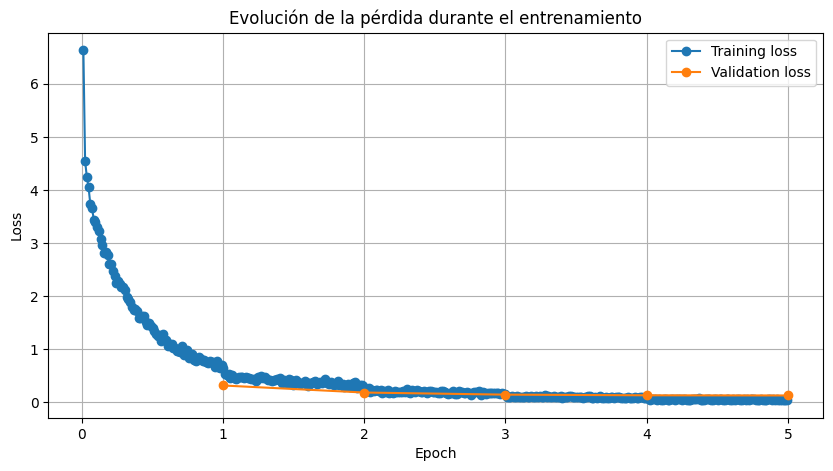

In [31]:
# Pintamos la evolución de training loss y validation loss

plt.figure(figsize=(10, 5))

if "loss" in df_logs.columns:
    df_train_loss = df_logs.dropna(subset=["loss"])
    plt.plot(
        df_train_loss["epoch"],
        df_train_loss["loss"],
        marker="o",
        label="Training loss"
    )

if "eval_loss" in df_logs.columns:
    df_eval_loss = df_logs.dropna(subset=["eval_loss"])
    plt.plot(
        df_eval_loss["epoch"],
        df_eval_loss["eval_loss"],
        marker="o",
        label="Validation loss"
    )

plt.title("Evolución de la pérdida durante el entrenamiento")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

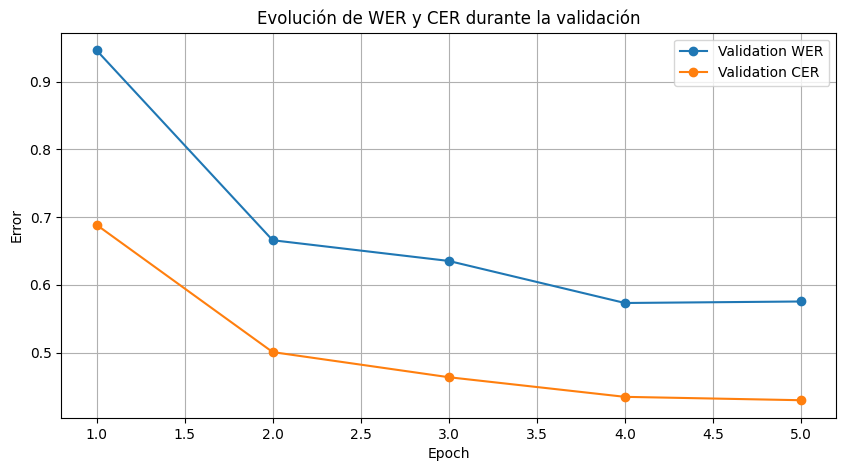

In [32]:
# Pintamos la evolución de WER y CER en validación

plt.figure(figsize=(10, 5))

if "eval_wer" in df_logs.columns:
    df_eval_wer = df_logs.dropna(subset=["eval_wer"])
    plt.plot(
        df_eval_wer["epoch"],
        df_eval_wer["eval_wer"],
        marker="o",
        label="Validation WER"
    )

if "eval_cer" in df_logs.columns:
    df_eval_cer = df_logs.dropna(subset=["eval_cer"])
    plt.plot(
        df_eval_cer["epoch"],
        df_eval_cer["eval_cer"],
        marker="o",
        label="Validation CER"
    )

plt.title("Evolución de WER y CER durante la validación")
plt.xlabel("Epoch")
plt.ylabel("Error")
plt.legend()
plt.grid(True)
plt.show()

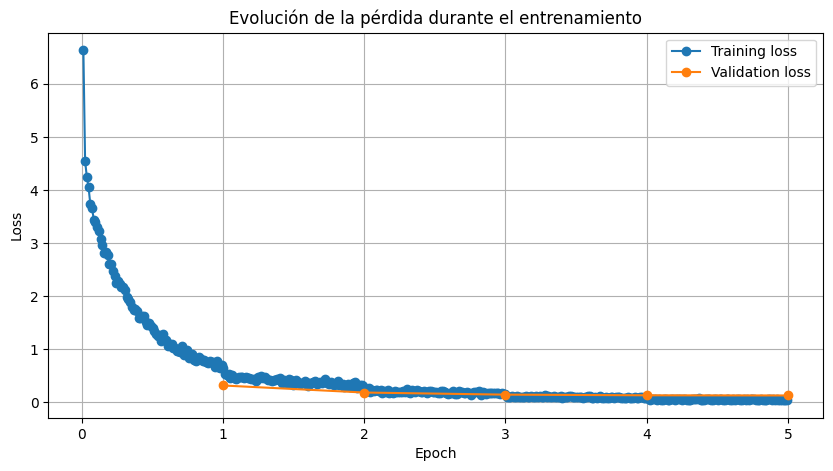

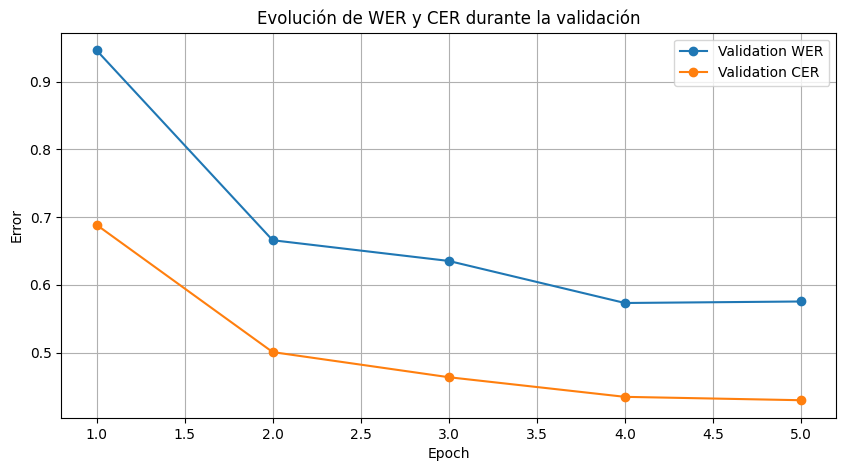

Gráficas guardadas correctamente
----------------------------------------
Loss: C:\lara\modelos_entrenados\whisper_base\grafica_loss.png
Métricas: C:\lara\modelos_entrenados\whisper_base\grafica_metricas.png


In [33]:
# Guardamos las gráficas en la carpeta del modelo

ruta_grafica_loss = os.path.join(OUTPUT_DIR, "grafica_loss.png")
ruta_grafica_metricas = os.path.join(OUTPUT_DIR, "grafica_metricas.png")

# Gráfica de loss
plt.figure(figsize=(10, 5))

if "loss" in df_logs.columns:
    df_train_loss = df_logs.dropna(subset=["loss"])
    plt.plot(df_train_loss["epoch"], df_train_loss["loss"], marker="o", label="Training loss")

if "eval_loss" in df_logs.columns:
    df_eval_loss = df_logs.dropna(subset=["eval_loss"])
    plt.plot(df_eval_loss["epoch"], df_eval_loss["eval_loss"], marker="o", label="Validation loss")

plt.title("Evolución de la pérdida durante el entrenamiento")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.savefig(ruta_grafica_loss, dpi=150, bbox_inches="tight")
plt.show()

# Gráfica de métricas
plt.figure(figsize=(10, 5))

if "eval_wer" in df_logs.columns:
    df_eval_wer = df_logs.dropna(subset=["eval_wer"])
    plt.plot(df_eval_wer["epoch"], df_eval_wer["eval_wer"], marker="o", label="Validation WER")

if "eval_cer" in df_logs.columns:
    df_eval_cer = df_logs.dropna(subset=["eval_cer"])
    plt.plot(df_eval_cer["epoch"], df_eval_cer["eval_cer"], marker="o", label="Validation CER")

plt.title("Evolución de WER y CER durante la validación")
plt.xlabel("Epoch")
plt.ylabel("Error")
plt.legend()
plt.grid(True)
plt.savefig(ruta_grafica_metricas, dpi=150, bbox_inches="tight")
plt.show()

print("Gráficas guardadas correctamente")
print("----------------------------------------")
print("Loss:", ruta_grafica_loss)
print("Métricas:", ruta_grafica_metricas)

In [36]:
# Auditamos 10 registros del conjunto de test:
# audio original, texto real y predicción del modelo

model.eval()

NUM_MUESTRAS_AUDITORIA = 10

# Creamos una versión del dataset preparado con el índice original
dataset_preparado_auditoria = dataset_preparado.add_column(
    "indice_original",
    list(range(len(dataset_preparado)))
)

# Repetimos exactamente la misma división que usamos para entrenar
dataset_split_auditoria = dataset_preparado_auditoria.train_test_split(
    test_size=0.20,
    seed=SEED
)

dataset_temp_auditoria = dataset_split_auditoria["test"].train_test_split(
    test_size=0.20,
    seed=SEED
)

dataset_test_auditoria = dataset_temp_auditoria["train"]

print("Registros disponibles para auditoría en test:", len(dataset_test_auditoria))
print("-" * 80)

# Seleccionamos 10 muestras aleatorias del conjunto de test
indices_test = np.random.choice(
    len(dataset_test_auditoria),
    size=NUM_MUESTRAS_AUDITORIA,
    replace=False
)

for contador, indice_test in enumerate(indices_test, start=1):
    muestra_test = dataset_test_auditoria[int(indice_test)]

    # Recuperamos el índice original del dataset completo
    indice_original = muestra_test["indice_original"]
    muestra_original = dataset[indice_original]

    # Reconstruimos la ruta del audio original
    ruta_audio = Path(muestra_original["audio"]["path"])

    if not ruta_audio.is_absolute():
        ruta_audio = Path(AUDIOS_CONVERTED_PATH) / ruta_audio.name

    # Cargamos el audio con librosa, igual que en el resto del cuaderno
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", message="PySoundFile failed.*")
        warnings.filterwarnings("ignore", category=FutureWarning)

        audio_array, sampling_rate = librosa.load(
            str(ruta_audio),
            sr=SAMPLING_RATE,
            mono=True
        )

    # Preparamos las características de entrada para el modelo
    input_features = torch.tensor(
        muestra_test["input_features"],
        dtype=torch.float32
    ).unsqueeze(0).to(DEVICE)

    # Generamos la predicción
    with torch.no_grad():
        predicted_ids = model.generate(
            input_features=input_features
        )

    prediccion = tokenizer.batch_decode(
        predicted_ids,
        skip_special_tokens=True
    )[0]

    texto_original = tokenizer.decode(
        muestra_test["labels"],
        skip_special_tokens=True
    )

    print("=" * 80)
    print(f"Muestra {contador}/{NUM_MUESTRAS_AUDITORIA}")
    print(f"Índice en test: {indice_test}")
    print(f"Índice original: {indice_original}")
    print(f"Ruta audio: {ruta_audio}")
    print("-" * 80)
    print("Texto original:")
    print(texto_original)
    print("-" * 80)
    print("Predicción del modelo:")
    print(prediccion)
    print("-" * 80)

    display(
        IPythonAudio(
            data=audio_array,
            rate=sampling_rate
        )
    )

Registros disponibles para auditoría en test: 6535
--------------------------------------------------------------------------------
Muestra 1/10
Índice en test: 365
Índice original: 21288
Ruta audio: C:\Lara\audios-230426\audios-s3\65af856f3a3c1f86a0ee0150_1737971389.wav
--------------------------------------------------------------------------------
Texto original:
EN LA CENA NOS PUSIERON PEPINOS.
--------------------------------------------------------------------------------
Predicción del modelo:
EN LA TELENOBRETA LLEVO EL TELÉFONO DE PASTILLAS.
--------------------------------------------------------------------------------


Muestra 2/10
Índice en test: 2405
Índice original: 33322
Ruta audio: C:\Lara\audios-230426\audios-s3\662819171ef22d020bf25236_1749105738.wav
--------------------------------------------------------------------------------
Texto original:
EL RECLUTA SOLTÓ EL ANCLA.
--------------------------------------------------------------------------------
Predicción del modelo:
A LUCAS LE GUSTA LA LASAÑA
--------------------------------------------------------------------------------


Muestra 3/10
Índice en test: 3068
Índice original: 29343
Ruta audio: C:\Lara\audios-230426\audios-s3\6628187f1ef22d020bf25232_1744007482.wav
--------------------------------------------------------------------------------
Texto original:
MARÍA ESTARÁ EN LA DISCOTECA MÍO, ESTÁ FLAMA
--------------------------------------------------------------------------------
Predicción del modelo:
MARINA ESTÁ EN LA DISCOTECA MÁSICA DE SANTA MARÍA
--------------------------------------------------------------------------------


Muestra 4/10
Índice en test: 3724
Índice original: 25382
Ruta audio: C:\Lara\audios-230426\audios-s3\67990c4b95cbee60f5ec1fb6_1740503932.wav
--------------------------------------------------------------------------------
Texto original:
EL CARACOL SACA SUS CUERNOS AL SOL.
--------------------------------------------------------------------------------
Predicción del modelo:
EL CARACOL SAGA EN SU COLEDIA AL SOL.
--------------------------------------------------------------------------------


Muestra 5/10
Índice en test: 5463
Índice original: 7779
Ruta audio: C:\Lara\audios-230426\audios-s3\6564622239048d0f405c669c_1716194775.wav
--------------------------------------------------------------------------------
Texto original:
EL FRAC DE FREDY ES DE FRANELA.
--------------------------------------------------------------------------------
Predicción del modelo:
EL FRAC DE FREDY ES DE FRANELA.
--------------------------------------------------------------------------------


Muestra 6/10
Índice en test: 2390
Índice original: 1546
Ruta audio: C:\Lara\audios-230426\audios-s3\64abc251fd69f36cac788680_1692092190.wav
--------------------------------------------------------------------------------
Texto original:
Mamá compra todos mis caprichos.
--------------------------------------------------------------------------------
Predicción del modelo:
Mamá compra todos mis caprichos.
--------------------------------------------------------------------------------


Muestra 7/10
Índice en test: 4543
Índice original: 10081
Ruta audio: C:\Lara\audios-230426\audios-s3\662819171ef22d020bf25236_1717656417.wav
--------------------------------------------------------------------------------
Texto original:
LOS AFRICANOS VIVEN EN ÁFRICA.
--------------------------------------------------------------------------------
Predicción del modelo:
LOS AFRICANOS VIVEN EN ÁFRICA.
--------------------------------------------------------------------------------


Muestra 8/10
Índice en test: 3944
Índice original: 38169
Ruta audio: C:\Lara\audios-230426\audios-s3\663a0843aa128a933ae4019e_1771934467.wav
--------------------------------------------------------------------------------
Texto original:
ME VA MUY BIEN EN EL GIMNASIO PORQUE ENTRENO LOS BÍCEPS.
--------------------------------------------------------------------------------
Predicción del modelo:
ME PUSO LOS DIENTES DE PUNTA.
--------------------------------------------------------------------------------


Muestra 9/10
Índice en test: 3325
Índice original: 26391
Ruta audio: C:\Lara\audios-230426\audios-s3\6628187f1ef22d020bf25232_1741592054.wav
--------------------------------------------------------------------------------
Texto original:
CON MI LÁPIZ DIBUJÉ UN JAZMÍN.
--------------------------------------------------------------------------------
Predicción del modelo:
¡CÓMO LA CERRADA EN MI CABAÑA!
--------------------------------------------------------------------------------


Muestra 10/10
Índice en test: 5017
Índice original: 24942
Ruta audio: C:\Lara\audios-230426\audios-s3\6564630939048d0f405c66b6_1740391780.wav
--------------------------------------------------------------------------------
Texto original:
LA SOPA ESTABA SUPER SALADA
--------------------------------------------------------------------------------
Predicción del modelo:
LA FOCA SE LLAMA SE FUE FABIOLA Y CAJA.
--------------------------------------------------------------------------------


## Resumen final

In [34]:
# Resumen final del entrenamiento

print("RESUMEN FINAL DEL ENTRENAMIENTO")
print("-" * 50)

print("Modelo base:", MODEL_NAME)
print("Modelo entrenado guardado en:", OUTPUT_DIR)
print("Dataset preparado:", PREPARED_DATASET)

print("-" * 50)
print("Registros:")
print("Train:", len(dataset_train_test_eval["train"]))
print("Validation:", len(dataset_train_test_eval["validation"]))
print("Test:", len(dataset_train_test_eval["test"]))

print("-" * 50)
print("Parámetros de entrenamiento:")
print("Epochs:", NUM_TRAIN_EPOCHS)
print("Learning rate:", LEARNING_RATE)
print("Batch train:", TRAIN_BATCH_SIZE)
print("Batch eval:", EVAL_BATCH_SIZE)
print("Gradient accumulation:", GRADIENT_ACCUMULATION_STEPS)
print("Batch efectivo:", TRAIN_BATCH_SIZE * GRADIENT_ACCUMULATION_STEPS)

print("-" * 50)
print("Resultados finales en test:")
print("Test loss:", metricas_test.get("test_loss"))
print("Test WER:", metricas_test.get("test_wer"))
print("Test CER:", metricas_test.get("test_cer"))

print("-" * 50)
print("Gráficas guardadas en:")
print(os.path.join(OUTPUT_DIR, "grafica_loss.png"))
print(os.path.join(OUTPUT_DIR, "grafica_metricas.png"))

RESUMEN FINAL DEL ENTRENAMIENTO
--------------------------------------------------
Modelo base: openai/whisper-base
Modelo entrenado guardado en: C:\lara\modelos_entrenados\whisper_base
Dataset preparado: C:\lara\datasets\lara_whisper_dataset_preparado
--------------------------------------------------
Registros:
Train: 32673
Validation: 1634
Test: 6535
--------------------------------------------------
Parámetros de entrenamiento:
Epochs: 5
Learning rate: 1e-05
Batch train: 4
Batch eval: 4
Gradient accumulation: 2
Batch efectivo: 8
--------------------------------------------------
Resultados finales en test:
Test loss: 0.13232871890068054
Test WER: 0.5755753732663011
Test CER: 0.4257612707932019
--------------------------------------------------
Gráficas guardadas en:
C:\lara\modelos_entrenados\whisper_base\grafica_loss.png
C:\lara\modelos_entrenados\whisper_base\grafica_metricas.png
